## 1、数据探索

In [1]:
import gc
import pandas as pd
import numpy as np 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn import metrics

from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
# 相关全局设置
pd.set_option('display.max_columns', None)
sns.set()
train_data = pd.read_csv('data/used_car_train_20200313.csv', sep=' ')
test_data = pd.read_csv('data/used_car_testB_20200421.csv', sep=' ')

In [2]:
train_data.head().append(train_data.tail())
train_data.describe()
train_data.info()

C:\Users\user\AppData\Local\Temp\ipykernel_16128\2304476722.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  train_data.head().append(train_data.tail())


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,0,736,20040402,30.0,6,1.0,0.0,0.0,60,12.5,0.0,1046,0,0,20160404,1850,43.357796,3.966344,0.050257,2.159744,1.143786,0.235676,0.101988,0.129549,0.022816,0.097462,-2.881803,2.804097,-2.420821,0.795292,0.914762
1,1,2262,20030301,40.0,1,2.0,0.0,0.0,0,15.0,-,4366,0,0,20160309,3600,45.305273,5.236112,0.137925,1.380657,-1.422165,0.264777,0.121004,0.135731,0.026597,0.020582,-4.900482,2.096338,-1.030483,-1.722674,0.245522
2,2,14874,20040403,115.0,15,1.0,0.0,0.0,163,12.5,0.0,2806,0,0,20160402,6222,45.978359,4.823792,1.319524,-0.998467,-0.996911,0.251410,0.114912,0.165147,0.062173,0.027075,-4.846749,1.803559,1.565330,-0.832687,-0.229963
3,3,71865,19960908,109.0,10,0.0,0.0,1.0,193,15.0,0.0,434,0,0,20160312,2400,45.687478,4.492574,-0.050616,0.883600,-2.228079,0.274293,0.110300,0.121964,0.033395,0.000000,-4.509599,1.285940,-0.501868,-2.438353,-0.478699
4,4,111080,20120103,110.0,5,1.0,0.0,0.0,68,5.0,0.0,6977,0,0,20160313,5200,44.383511,2.031433,0.572169,-1.571239,2.246088,0.228036,0.073205,0.091880,0.078819,0.121534,-1.896240,0.910783,0.931110,2.834518,1.923482
149995,149995,163978,20000607,121.0,10,4.0,0.0,1.0,163,15.0,0.0,4576,0,0,20160327,5900,45.316543,-3.139095,-1.269707,-0.736609,-1.505820,0.280264,0.000310,0.048441,0.071158,0.019174,1.988114,-2.983973,0.589167,-1.304370,-0.302592
149996,149996,184535,20091102,116.0,11,0.0,0.0,0.0,125,10.0,0.0,2826,0,0,20160312,9500,45.972058,-3.143764,-0.023523,-2.366699,0.698012,0.253217,0.000777,0.084079,0.099681,0.079371,1.839166,-2.774615,2.553994,0.924196,-0.272160
149997,149997,147587,20101003,60.0,11,1.0,1.0,0.0,90,6.0,0.0,3302,0,0,20160328,7500,44.733481,-3.105721,0.595454,-2.279091,1.423661,0.233353,0.000705,0.118872,0.100118,0.097914,2.439812,-1.630677,2.290197,1.891922,0.414931
149998,149998,45907,20060312,34.0,10,3.0,1.0,0.0,156,15.0,0.0,1877,0,0,20160401,4999,45.658634,-3.204785,-0.441680,-1.179812,0.620680,0.256369,0.000252,0.081479,0.083558,0.081498,2.075380,-2.633719,1.414937,0.431981,-1.659014
149999,149999,177672,19990204,19.0,28,6.0,0.0,1.0,193,12.5,0.0,235,0,0,20160305,4700,45.536383,-3.200326,-1.612893,-0.067144,-1.396166,0.284475,0.000000,0.040072,0.062543,0.025819,1.978453,-3.179913,0.031724,-1.483350,-0.342674


,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
count,150000.000000,150000.000000,1.500000e+05,149999.000000,150000.000000,145494.000000,141320.000000,144019.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.0,1.500000e+05,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,74999.500000,68349.172873,2.003417e+07,47.129021,8.052733,1.792369,0.375842,0.224943,119.316547,12.597160,2583.077267,0.000007,0.0,2.016033e+07,5923.327333,44.406268,-0.044809,0.080765,0.078833,0.017875,0.248204,0.044923,0.124692,0.058144,0.061996,-0.001000,0.009035,0.004813,0.000313,-0.000688
std,43301.414527,61103.875095,5.364988e+04,49.536040,7.864956,1.760640,0.548677,0.417546,177.168419,3.919576,1885.363218,0.002582,0.0,1.067328e+02,7501.998477,2.457548,3.641893,2.929618,2.026514,1.193661,0.045804,0.051743,0.201410,0.029186,0.035692,3.772386,3.286071,2.517478,1.288988,1.038685
min,0.000000,0.000000,1.991000e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.0,2.015062e+07,11.000000,30.451976,-4.295589,-4.470671,-7.275037,-4.364565,0.000000,0.000000,0.000000,0.000000,0.000000,-9.168192,-5.558207,-9.639552,-4.153899,-6.546556
25%,37499.750000,11156.000000,1.999091e+07,10.000000,1.000000,0.000000,0.000000,0.000000,75.000000,12.500000,1018.000000,0.000000,0.0,2.016031e+07,1300.000000,43.135799,-3.192349,-0.970671,-1.462580,-0.921191,0.243615,0.000038,0.062474,0.035334,0.033930,-3.722303,-1.951543,-1.871846,-1.057789,-0.437034
50%,74999.500000,51638.000000,2.003091e+07,30.000000,6.000000,1.000000,0.000000,0.000000,110.000000,15.000000,2196.000000,0.000000,0.0,2.016032e+07,3250.000000,44.610266,-3.052671,-0.382947,0.099722,-0.075910,0.257798,0.000812,0.095866,0.057014,0.058484,1.624076,-0.358053,-0.130753,-0.036245,0.141246
75%,112499.250000,118841.250000,2.007111e+07,66.000000,13.000000,3.000000,1.000000,0.000000,150.000000,15.000000,3843.000000,0.000000,0.0,2.016033e+07,7700.000000,46.004721,4.000670,0.241335,1.565838,0.868758,0.265297,0.102009,0.125243,0.079382,0.087491,2.844357,1.255022,1.776933,0.942813,0.680378
max,149999.000000,196812.000000,2.015121e+07,247.000000,39.000000,7.000000,6.000000,1.000000,19312.000000,15.000000,8120.000000,1.000000,0.0,2.016041e+07,99999.000000,52.304178,7.320308,19.035496,9.854702,6.829352,0.291838,0.151420,1.404936,0.160791,0.222787,12.357011,18.819042,13.847792,11.147669,8.658418


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   SaleID             150000 non-null  int64  
 1   name               150000 non-null  int64  
 2   regDate            150000 non-null  int64  
 3   model              149999 non-null  float64
 4   brand              150000 non-null  int64  
 5   bodyType           145494 non-null  float64
 6   fuelType           141320 non-null  float64
 7   gearbox            144019 non-null  float64
 8   power              150000 non-null  int64  
 9   kilometer          150000 non-null  float64
 10  notRepairedDamage  150000 non-null  object 
 11  regionCode         150000 non-null  int64  
 12  seller             150000 non-null  int64  
 13  offerType          150000 non-null  int64  
 14  creatDate          150000 non-null  int64  
 15  price              150000 non-null  int64  
 16  v_

查看数据的缺失情况

In [3]:
date_cols = ['regDate', 'creatDate']
cate_cols = ['name', 'model', 'brand', 'bodyType', 'fuelType', 'gearbox', 'notRepairedDamage', 'regionCode', 'seller', 'offerType']
num_cols = ['power', 'kilometer'] + ['v_{}'.format(i) for i in range(15)]
data = pd.concat([train_data, test_data])
cols = date_cols + cate_cols + num_cols

tmp = pd.DataFrame()
tmp['count'] = data[cols].count().values
tmp['missing_rate'] = (data.shape[0] - tmp['count']) / data.shape[0]
tmp['nunique'] = data[cols].nunique().values
tmp.index = cols
tmp

,count,missing_rate,nunique
regDate,200000,0.000000,3898
creatDate,200000,0.000000,106
name,200000,0.000000,128660
model,199999,0.000005,248
brand,200000,0.000000,40
bodyType,193990,0.030050,8
fuelType,188396,0.058020,7
gearbox,192051,0.039745,2
notRepairedDamage,200000,0.000000,3
regionCode,200000,0.000000,8010


缺失的数据有model 、bodyType fuelType  gearbox, 但是缺失的值都很少 

C:\Users\user\AppData\Local\Temp\ipykernel_16128\3497599393.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data['price'])


<Axes: xlabel='price', ylabel='Density'>

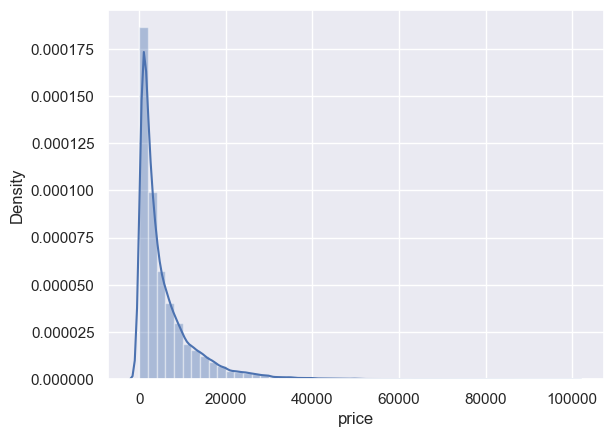

In [4]:
sns.distplot(train_data['price'])

C:\Users\user\AppData\Local\Temp\ipykernel_16128\3877226980.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data['model'])


<Axes: xlabel='model', ylabel='Density'>

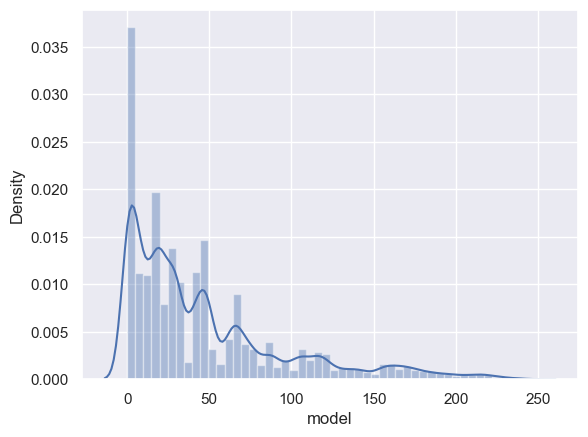

In [5]:
sns.distplot(train_data['model'])

In [6]:
train_data.model.fillna(0,inplace = True)

C:\Users\user\AppData\Local\Temp\ipykernel_16128\3359817424.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data['bodyType'])


<Axes: xlabel='bodyType', ylabel='Density'>

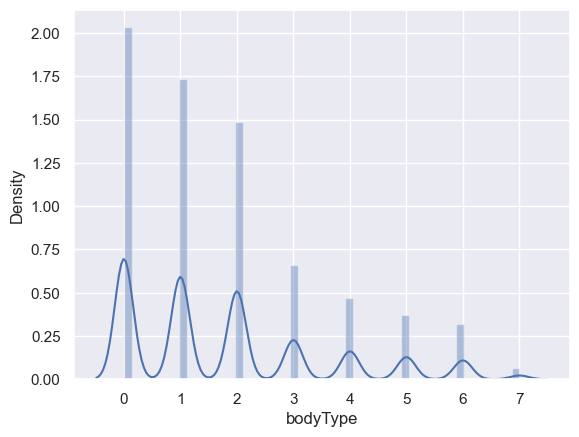

In [7]:
sns.distplot(train_data['bodyType'])

In [8]:
train_data.bodyType.fillna(-1,inplace = True)

C:\Users\user\AppData\Local\Temp\ipykernel_16128\203460212.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data['fuelType'])


<Axes: xlabel='fuelType', ylabel='Density'>

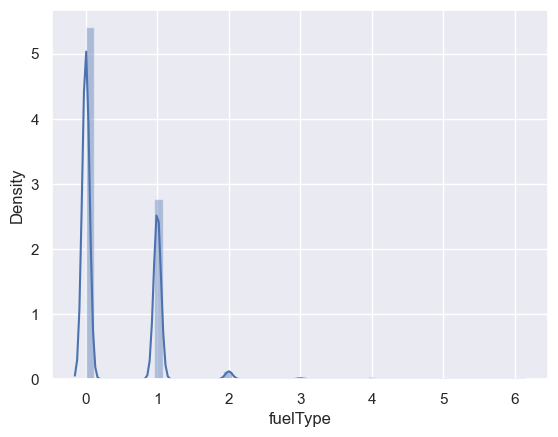

In [9]:
sns.distplot(train_data['fuelType'])

In [10]:
train_data.fuelType.fillna(-1,inplace = True)

C:\Users\user\AppData\Local\Temp\ipykernel_16128\2858375105.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train_data['gearbox'])


<Axes: xlabel='gearbox', ylabel='Density'>

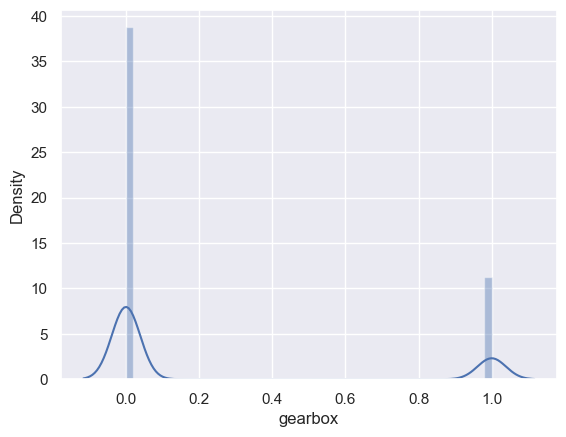

In [11]:
sns.distplot(train_data['gearbox'])

In [12]:
train_data.gearbox.fillna(-1,inplace = True)

查看数值属性的箱型图

<Axes: >

<Axes: >

Text(0, 0.5, 'power')

<Axes: >

<Axes: >

Text(0, 0.5, 'kilometer')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_0')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_1')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_2')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_3')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_4')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_5')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_6')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_7')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_8')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_9')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_10')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_11')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_12')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_13')

<Axes: >

<Axes: >

Text(0, 0.5, 'v_14')

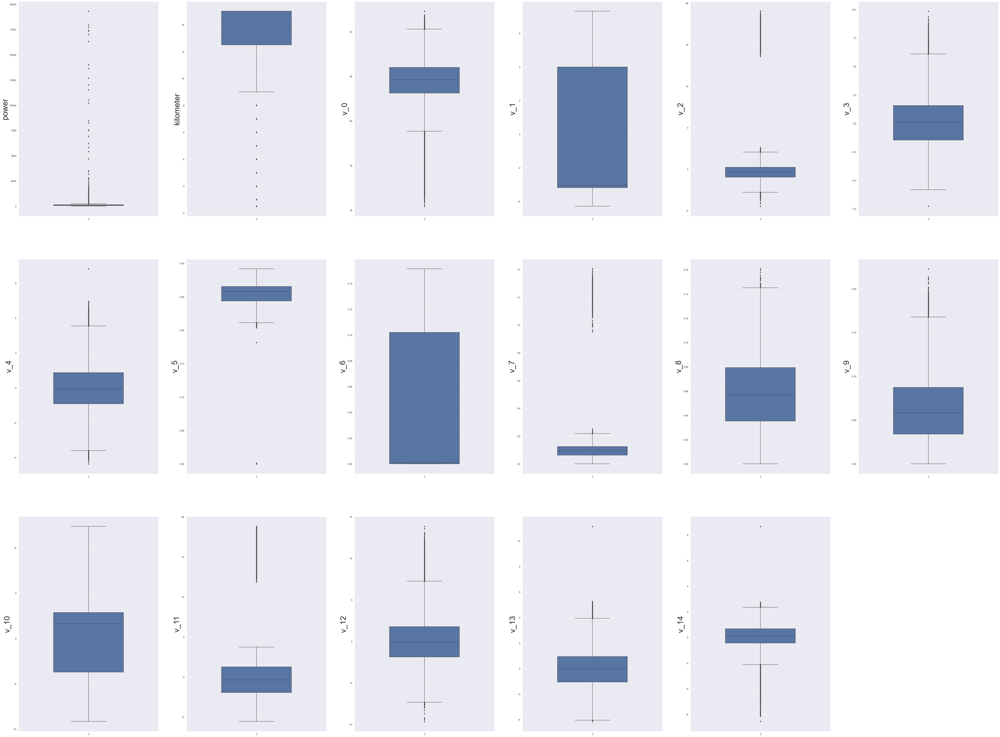

In [13]:
fig = plt.figure(figsize=(80,60),dpi=75)
for i in range(17):
    plt.subplot(3,6, i+1)
    sns.boxplot(train_data[num_cols[i]], orient='v', width=0.5)
    plt.ylabel(num_cols[i], fontsize=36)
plt.show()

power的范围为0-600

In [14]:
train_data[(train_data['power']>600) | (train_data['power']<0)]

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
221,221,20197,20080601,19.0,1,2.0,0.0,1.0,740,15.0,0.0,4526,0,0,20160308,21400,48.037180,5.532011,1.451098,-2.346850,-0.984982,0.262385,0.125919,0.147585,0.079600,0.025042,-6.400438,0.815636,3.269936,-0.733383,0.831899
534,534,6237,19990409,67.0,0,1.0,0.0,0.0,7515,15.0,-,3641,0,0,20160402,1499,42.167378,-3.078184,-0.719028,1.187968,0.826739,0.238117,0.000250,0.100580,0.049342,0.088342,3.555141,-0.366126,-1.816826,0.920527,0.812724
919,919,1562,20040604,132.0,27,1.0,0.0,0.0,1398,0.5,0.0,953,0,0,20160322,3200,44.398884,4.920068,0.511202,0.763181,2.282986,0.228201,0.115767,0.118895,0.042249,0.130208,-4.199526,2.662710,-0.957741,1.838586,-1.114221
4077,4077,108917,19981103,29.0,0,1.0,0.0,1.0,601,15.0,0.0,976,0,0,20160313,1100,42.720943,-3.224472,-0.479772,2.124592,0.288400,0.241212,0.000000,0.144002,0.038365,0.075881,3.634530,-0.311470,-1.991555,-0.144553,0.192986
4398,4398,98510,20040912,17.0,10,0.0,1.0,1.0,1771,7.0,-,388,0,0,20160314,9500,46.745149,-3.303516,0.267275,-1.066983,-1.151539,0.266496,0.000486,0.149399,0.082193,0.027145,1.883733,-2.742726,2.330571,-1.369522,0.382043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148030,148030,116926,20090909,16.0,13,1.0,6.0,0.0,776,6.0,0.0,7269,0,0,20160329,7000,43.003527,-2.876417,-0.166267,-2.945366,1.128145,0.236118,0.000949,0.047134,0.103169,0.085856,2.648312,-1.378900,1.499183,2.577718,1.356235
148246,148246,62491,19960707,49.0,1,2.0,-1.0,0.0,2598,15.0,-,2610,0,0,20160305,1000,44.564949,3.293497,-0.306318,2.763745,-1.529225,0.264961,0.093730,0.146648,0.012300,0.023228,-2.808591,1.690109,-2.236208,-2.295353,-0.660206
148365,148365,117308,20040701,13.0,4,2.0,1.0,1.0,17700,15.0,0.0,2128,0,0,20160320,6000,45.209563,-3.184795,-0.075872,-1.148808,-1.624366,0.265786,0.000190,0.122578,0.079114,0.011017,2.269612,-2.202957,1.542557,-1.271968,0.338862
148665,148665,169605,19970112,13.0,4,2.0,-1.0,0.0,19312,15.0,0.0,2160,0,0,20160309,1500,44.106748,-3.289364,-0.678614,1.881311,-1.549975,0.264707,0.000000,0.144216,0.038921,0.022253,3.043651,-1.330544,-1.229440,-2.121242,-0.435759


In [15]:
train_data[(train_data['power']>600)]

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
221,221,20197,20080601,19.0,1,2.0,0.0,1.0,740,15.0,0.0,4526,0,0,20160308,21400,48.037180,5.532011,1.451098,-2.346850,-0.984982,0.262385,0.125919,0.147585,0.079600,0.025042,-6.400438,0.815636,3.269936,-0.733383,0.831899
534,534,6237,19990409,67.0,0,1.0,0.0,0.0,7515,15.0,-,3641,0,0,20160402,1499,42.167378,-3.078184,-0.719028,1.187968,0.826739,0.238117,0.000250,0.100580,0.049342,0.088342,3.555141,-0.366126,-1.816826,0.920527,0.812724
919,919,1562,20040604,132.0,27,1.0,0.0,0.0,1398,0.5,0.0,953,0,0,20160322,3200,44.398884,4.920068,0.511202,0.763181,2.282986,0.228201,0.115767,0.118895,0.042249,0.130208,-4.199526,2.662710,-0.957741,1.838586,-1.114221
4077,4077,108917,19981103,29.0,0,1.0,0.0,1.0,601,15.0,0.0,976,0,0,20160313,1100,42.720943,-3.224472,-0.479772,2.124592,0.288400,0.241212,0.000000,0.144002,0.038365,0.075881,3.634530,-0.311470,-1.991555,-0.144553,0.192986
4398,4398,98510,20040912,17.0,10,0.0,1.0,1.0,1771,7.0,-,388,0,0,20160314,9500,46.745149,-3.303516,0.267275,-1.066983,-1.151539,0.266496,0.000486,0.149399,0.082193,0.027145,1.883733,-2.742726,2.330571,-1.369522,0.382043
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148030,148030,116926,20090909,16.0,13,1.0,6.0,0.0,776,6.0,0.0,7269,0,0,20160329,7000,43.003527,-2.876417,-0.166267,-2.945366,1.128145,0.236118,0.000949,0.047134,0.103169,0.085856,2.648312,-1.378900,1.499183,2.577718,1.356235
148246,148246,62491,19960707,49.0,1,2.0,-1.0,0.0,2598,15.0,-,2610,0,0,20160305,1000,44.564949,3.293497,-0.306318,2.763745,-1.529225,0.264961,0.093730,0.146648,0.012300,0.023228,-2.808591,1.690109,-2.236208,-2.295353,-0.660206
148365,148365,117308,20040701,13.0,4,2.0,1.0,1.0,17700,15.0,0.0,2128,0,0,20160320,6000,45.209563,-3.184795,-0.075872,-1.148808,-1.624366,0.265786,0.000190,0.122578,0.079114,0.011017,2.269612,-2.202957,1.542557,-1.271968,0.338862
148665,148665,169605,19970112,13.0,4,2.0,-1.0,0.0,19312,15.0,0.0,2160,0,0,20160309,1500,44.106748,-3.289364,-0.678614,1.881311,-1.549975,0.264707,0.000000,0.144216,0.038921,0.022253,3.043651,-1.330544,-1.229440,-2.121242,-0.435759


有143行数据是power>600,  大于600 的使用600来填充

In [16]:
train_data['power'].mask(train_data['power']>600,600, inplace=True)

In [17]:
train_data.power

0          60
1           0
2         163
3         193
4          68
         ... 
149995    163
149996    125
149997     90
149998    156
149999    193
Name: power, Length: 150000, dtype: int64

In [18]:
train_data[(train_data['power']>600)]

,SaleID,name,regDate,model,brand,bodyType,fuelType,gearbox,power,kilometer,notRepairedDamage,regionCode,seller,offerType,creatDate,price,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14


kilometer中有些值很低，但是应该也是正常的部分

In [19]:
train_data.kilometer.describe()

count    150000.000000
mean         12.597160
std           3.919576
min           0.500000
25%          12.500000
50%          15.000000
75%          15.000000
max          15.000000
Name: kilometer, dtype: float64

In [20]:
train_data.notRepairedDamage.unique()

array(['0.0', '-', '1.0'], dtype=object)

In [21]:
train_data.notRepairedDamage.nunique()

3

In [22]:
train_data.notRepairedDamage.value_counts()

0.0    111361
-       24324
1.0     14315
Name: notRepairedDamage, dtype: int64

“-” 表示是不清楚，而且数量不少

In [23]:
train_data.notRepairedDamage.replace('-','-1',inplace=True)

In [24]:
train_data.notRepairedDamage.value_counts()

0.0    111361
-1      24324
1.0     14315
Name: notRepairedDamage, dtype: int64

异常值的处理

In [25]:
train_data.v_1.describe()

count    150000.000000
mean         -0.044809
std           3.641893
min          -4.295589
25%          -3.192349
50%          -3.052671
75%           4.000670
max           7.320308
Name: v_1, dtype: float64

v_3         -0.730946
kilometer   -0.440519
v_11        -0.275320
v_10        -0.246175
v_9         -0.206205
v_4         -0.147085
v_7         -0.053024
v_13        -0.013993
v_14         0.035911
v_1          0.060914
v_6          0.068970
v_2          0.085322
v_5          0.164317
power        0.556400
v_0          0.628397
v_8          0.685798
v_12         0.692823
price        1.000000
Name: price, dtype: float64

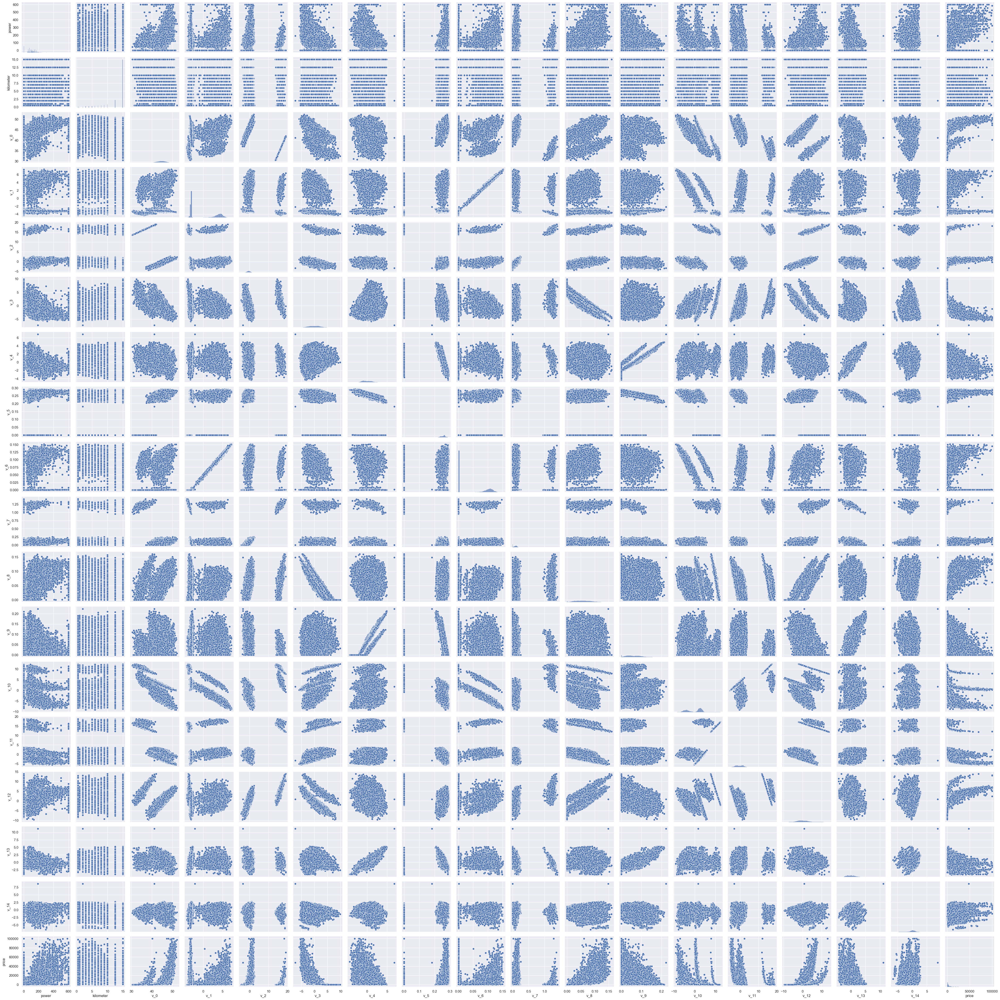

In [26]:
#特征与目标变量之前的相关性分析
correlation = train_data[num_cols+['price']].corr()
correlation['price'].sort_values()

#特征相互之间的关系可视化
sns.pairplot(train_data[num_cols+['price']])

In [27]:
# 通过一个模型来寻找异常值
def find_outliers(model, X, y, sigma=3):
    # 先进行预测
    try:
        y_pred = pd.Series(model.predict(X), index = y.index)
        # 如果预测失败，先训练模型
    except:
        model.fit(X,y)
        y_pred = pd.Series(model.predict(X), index = y.index)
    
    # 计算真实值和预测值之间的差异
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    # 计算Z数据，定义异常值的范围
    z = (resid - mean_resid)/std_resid
    outliers = z[abs(z)>sigma].index
    
    print('R2=', model.score(X,y))
    print('mae=', mean_absolute_error(y, y_pred))
    print('---------------------------------')
    
    print('mean of residuals:',mean_resid)
    print('std of residuals:',std_resid)
    print('----------------------------------')
    
    print(len(outliers),'outliers:')
    print(outliers.tolist())
    
    plt.figure(figsize=(15,5))
    ax_131 = plt.subplot(1,3,1)
    plt.plot(y, y_pred,'.')
    plt.plot(y.loc[outliers], y_pred.loc[outliers],'ro')
    plt.legend(['Accepted','Outliers'])
    plt.xlabel['y']
    plt.ylabel['y_pred']
    
    ax_132 = plt.subplot(1,3,2)
    plt.plot(y, y-y_pred,'.')
    plt.plot(y.loc[outliers], y_pred.loc[outliers]-y_pred.loc[outliers],'ro')
    plt.legend(['Accepted','Outliers'])
    plt.xlabel['y']
    plt.ylabel['y - y_pred']
    
    ax_133 = plt.subplot(1,3,3)
    z.plot.hist(bins=50, ax=ax_133)
    z.loc[outliers].plot.hist(color='r',bins=50, ax = ax_133)
    plt.legend(['Accepted','Outliers'])
    plt.xlabel['z']
    
    plt.show()
    
    return outliers

In [28]:
# 岭回归查找异常值
# from sklearn.linear_model import Ridge
# from sklearn.metrics import mean_absolute_error
# X_train = train_data[num_cols]
# y_train = train_data['price']
# outliers = find_outliers(Ridge(), X_train, y_train)

QQ图

In [29]:
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

<Figure size 2400x12400 with 0 Axes>

<Axes: xlabel='power', ylabel='Density'>

<Axes: xlabel='kilometer', ylabel='Density'>

<Axes: xlabel='v_0', ylabel='Density'>

<Axes: xlabel='v_1', ylabel='Density'>

<Axes: xlabel='v_2', ylabel='Density'>

<Axes: xlabel='v_3', ylabel='Density'>

<Axes: xlabel='v_4', ylabel='Density'>

<Axes: xlabel='v_5', ylabel='Density'>

<Axes: xlabel='v_6', ylabel='Density'>

<Axes: xlabel='v_7', ylabel='Density'>

<Axes: xlabel='v_8', ylabel='Density'>

<Axes: xlabel='v_9', ylabel='Density'>

<Axes: xlabel='v_10', ylabel='Density'>

<Axes: xlabel='v_11', ylabel='Density'>

<Axes: xlabel='v_12', ylabel='Density'>

<Axes: xlabel='v_13', ylabel='Density'>

<Axes: xlabel='v_14', ylabel='Density'>

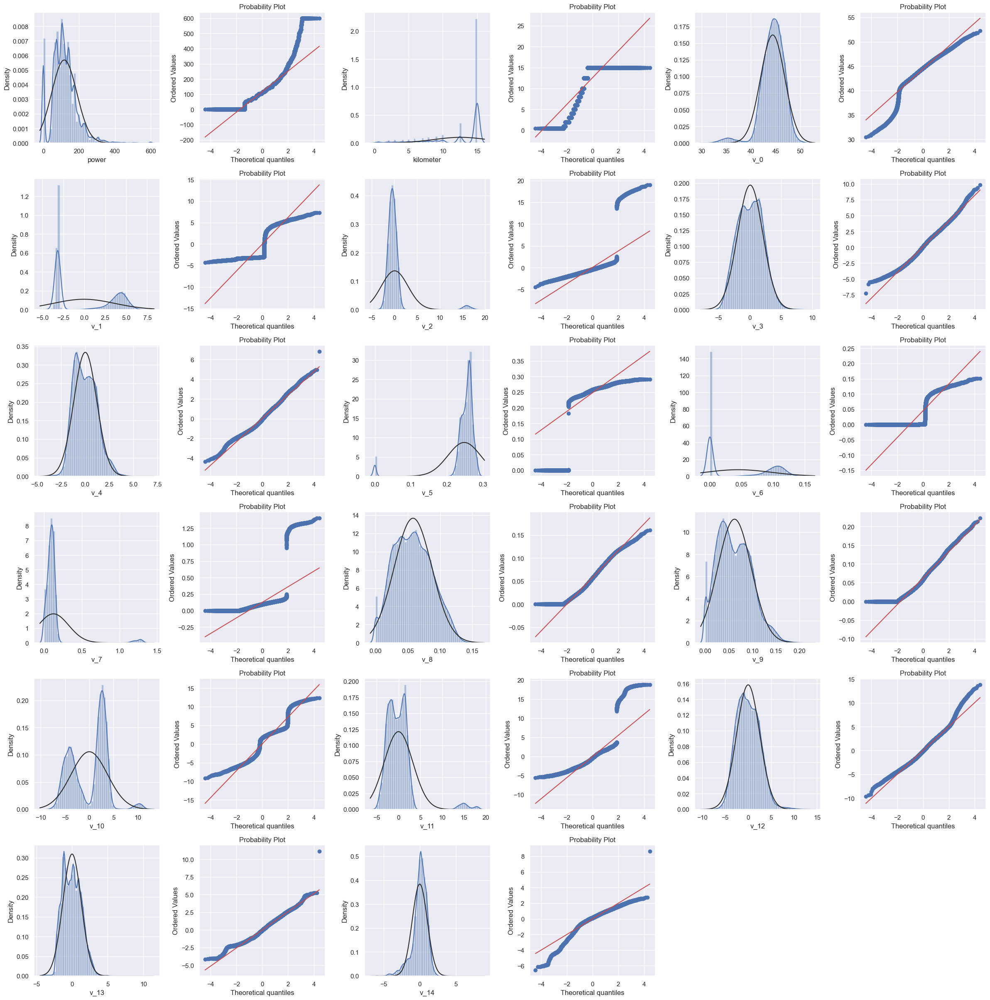

In [30]:
train_cols = 6
train_rows = len(train_data.columns)
plt.figure(figsize=(4*train_cols, 4*train_rows))

i = 0
for col in num_cols:
    i+=1
    ax = plt.subplot(train_rows, train_cols, i)
    sns.distplot(train_data[col],fit=stats.norm)
    
    i+=1
    ax = plt.subplot(train_rows, train_cols, i)
    res = stats.probplot(train_data[col], plot=plt)

plt.tight_layout()
plt.show()

v4 v9 v12 符合正太分布

查看训练集和测试集偏度和峰度

In [31]:
tmp = pd.DataFrame(index = num_cols)
for col in num_cols:
    tmp.loc[col, 'train_Skewness'] = train_data[col].skew()
    tmp.loc[col, 'test_Skewness'] = test_data[col].skew()
    tmp.loc[col, 'train_Kurtosis'] = train_data[col].kurt()
    tmp.loc[col, 'test_Kurtosis'] = test_data[col].kurt()
tmp

,train_Skewness,test_Skewness,train_Kurtosis,test_Kurtosis
power,1.242879,60.022958,4.808097,4533.765856
kilometer,-1.525921,-1.523389,1.141934,1.132865
v_0,-1.316712,-1.309174,3.993841,3.975003
v_1,0.359454,0.371557,-1.753017,-1.741503
v_2,4.842556,4.842439,23.860591,23.851258
v_3,0.106292,0.085307,-0.418006,-0.441850
v_4,0.367989,0.376527,-0.197295,-0.217030
v_5,-4.737094,-4.729964,22.934081,22.874850
v_6,0.368073,0.380337,-1.742567,-1.730630
v_7,5.130233,5.127163,25.845489,25.825960


<Figure size 2400x6800 with 0 Axes>

Text(0.5, 0, 'power')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'kilometer')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_0')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_1')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_2')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_3')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_4')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_5')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_6')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_7')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_8')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_9')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_10')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_11')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_12')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_13')

Text(0, 0.5, 'Frequency')

Text(0.5, 0, 'v_14')

Text(0, 0.5, 'Frequency')

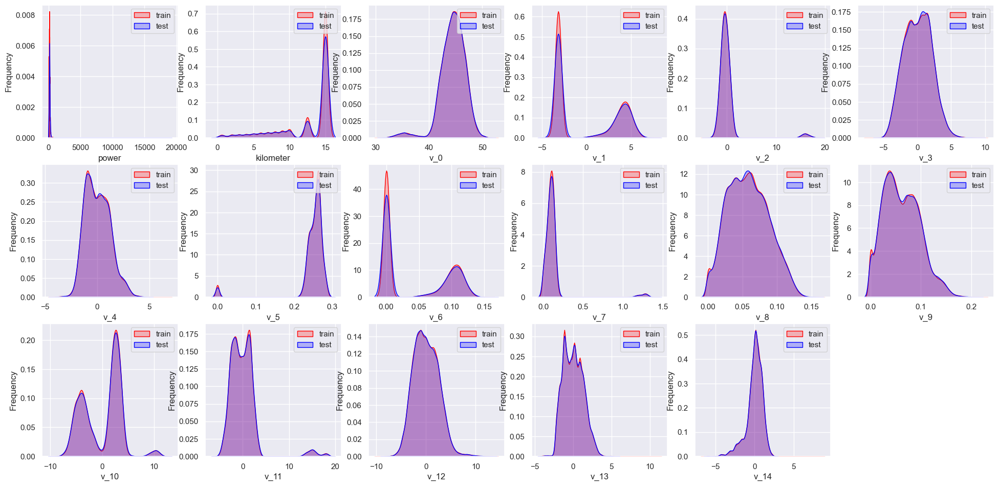

In [32]:
dist_cols = 6
dist_rows = len(num_cols)
plt.figure(figsize=(4*dist_cols, 4* dist_rows))

i=1
for col in num_cols:
    ax = plt.subplot(dist_rows, dist_cols, i)
    ax = sns.kdeplot(train_data[col], color="Red", shade=True)
    ax = sns.kdeplot(test_data[col], color="Blue", shade=True)
    ax.set_xlabel(col)
    ax.set_ylabel("Frequency")
    ax = ax.legend(['train','test'])
    i+=1
plt.show()

训练集和测试集分布相似，做box-cox变换

In [33]:
data_all = pd.concat([train_data[num_cols], test_data[num_cols]])
data_all.head()

,power,kilometer,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14
0,60,12.5,43.357796,3.966344,0.050257,2.159744,1.143786,0.235676,0.101988,0.129549,0.022816,0.097462,-2.881803,2.804097,-2.420821,0.795292,0.914762
1,0,15.0,45.305273,5.236112,0.137925,1.380657,-1.422165,0.264777,0.121004,0.135731,0.026597,0.020582,-4.900482,2.096338,-1.030483,-1.722674,0.245522
2,163,12.5,45.978359,4.823792,1.319524,-0.998467,-0.996911,0.251410,0.114912,0.165147,0.062173,0.027075,-4.846749,1.803559,1.565330,-0.832687,-0.229963
3,193,15.0,45.687478,4.492574,-0.050616,0.883600,-2.228079,0.274293,0.110300,0.121964,0.033395,0.000000,-4.509599,1.285940,-0.501868,-2.438353,-0.478699
4,68,5.0,44.383511,2.031433,0.572169,-1.571239,2.246088,0.228036,0.073205,0.091880,0.078819,0.121534,-1.896240,0.910783,0.931110,2.834518,1.923482


In [34]:
# 归一化处理
def scale_minmax(col):
    return (col-col.min())/(col.max()-col.min())

train_data_process = train_data[num_cols]
train_data_process = train_data_process[num_cols].apply(scale_minmax,axis=0)
test_data_process =test_data[num_cols]
test_data_process = test_data_process[num_cols].apply(scale_minmax,axis=0)

<Figure size 2400x6800 with 0 Axes>

<Axes: >

<Axes: xlabel='power', ylabel='Density'>

Text(0.5, 1.0, 'powerOriginal')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=1.2429')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.56')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'powerTransformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0362')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.51')

<Axes: >

<Axes: xlabel='kilometer', ylabel='Density'>

Text(0.5, 1.0, 'kilometerOriginal')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-1.5259')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.44')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'kilometerTransformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.8499')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.43')

<Axes: >

<Axes: xlabel='v_0', ylabel='Density'>

Text(0.5, 1.0, 'v_0Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-1.3167')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.63')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_0Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0619')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.75')

<Axes: >

<Axes: xlabel='v_1', ylabel='Density'>

Text(0.5, 1.0, 'v_1Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.3595')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.06')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_1Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.2804')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.04')

<Axes: >

<Axes: xlabel='v_2', ylabel='Density'>

Text(0.5, 1.0, 'v_2Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=4.8425')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.09')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_2Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0857')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.39')

<Axes: >

<Axes: xlabel='v_3', ylabel='Density'>

Text(0.5, 1.0, 'v_3Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.1063')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.73')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_3Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0056')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.74')

<Axes: >

<Axes: xlabel='v_4', ylabel='Density'>

Text(0.5, 1.0, 'v_4Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.3680')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.15')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_4Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0083')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.15')

<Axes: >

<Axes: xlabel='v_5', ylabel='Density'>

Text(0.5, 1.0, 'v_5Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-4.7370')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.16')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_5Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.3991')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.31')

<Axes: >

<Axes: xlabel='v_6', ylabel='Density'>

Text(0.5, 1.0, 'v_6Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.3681')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.07')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_6Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.2891')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.05')

<Axes: >

<Axes: xlabel='v_7', ylabel='Density'>

Text(0.5, 1.0, 'v_7Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=5.1302')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.05')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_7Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0506')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.04')

<Axes: >

<Axes: xlabel='v_8', ylabel='Density'>

Text(0.5, 1.0, 'v_8Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.2046')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.69')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_8Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0060')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.67')

<Axes: >

<Axes: xlabel='v_9', ylabel='Density'>

Text(0.5, 1.0, 'v_9Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.4195')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.21')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_9Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0161')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.21')

<Axes: >

<Axes: xlabel='v_10', ylabel='Density'>

Text(0.5, 1.0, 'v_10Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0252')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.25')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_10Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0251')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.25')

<Axes: >

<Axes: xlabel='v_11', ylabel='Density'>

Text(0.5, 1.0, 'v_11Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=3.0291')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.28')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_11Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-0.0541')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.41')

<Axes: >

<Axes: xlabel='v_12', ylabel='Density'>

Text(0.5, 1.0, 'v_12Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.3654')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.69')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_12Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0024')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.68')

<Axes: >

<Axes: xlabel='v_13', ylabel='Density'>

Text(0.5, 1.0, 'v_13Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.2679')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.01')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_13Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.0105')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=-0.01')

<Axes: >

<Axes: xlabel='v_14', ylabel='Density'>

Text(0.5, 1.0, 'v_14Original')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=-1.1863')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.04')

<Axes: >

<Axes: ylabel='Density'>

Text(0.5, 1.0, 'v_14Transformed')

Text(0.5, 0, '')

<Axes: >

Text(0.5, 1.0, 'skew=0.1662')

Text(0.5, 0, '')

Text(0, 0.5, '')

<Axes: >

Text(0.5, 1.0, 'corr=0.10')

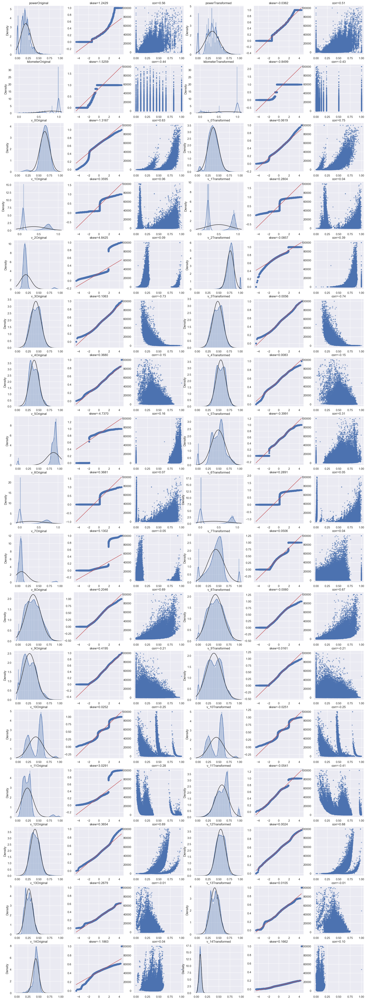

In [35]:
train_data_process = pd.concat([train_data_process, train_data['price']], axis=1)
fcols= 6
frows = 17
plt.figure(figsize=(4*fcols, 4*frows))
i = 0

for var in num_cols:
    dat = train_data_process[[var, 'price']].dropna()
    i+=1
    plt.subplot(frows,fcols,i)
    sns.distplot(dat[var],fit=stats.norm)
    plt.title(var+'Original')
    plt.xlabel('')
    i+=1
    plt.subplot(frows,fcols, i)
    _ = stats.probplot(dat[var], plot=plt)
    plt.title('skew='+'{:.4f}'.format(stats.skew(dat[var])))
    plt.xlabel('')
    plt.ylabel('')
    i+=1
    plt.subplot(frows,fcols, i)
    plt.plot(dat[var],dat['price'],'.',alpha=0.5)
    plt.title('corr='+'{:.2f}'.format(np.corrcoef(dat[var],dat['price'])[0][1]))
    i+=1
    plt.subplot(frows,fcols, i)
    trans_var, lambda_var = stats.boxcox(dat[var].dropna()+1)
    trans_var = scale_minmax(trans_var)
    sns.distplot(trans_var, fit=stats.norm)
    plt.title(var+'Transformed')
    plt.xlabel('')
    i+=1
    plt.subplot(frows,fcols, i)
    _ = stats.probplot(trans_var, plot=plt)
    plt.title('skew='+'{:.4f}'.format(stats.skew(trans_var)))
    plt.xlabel('')
    plt.ylabel('')
    i+=1
    plt.subplot(frows,fcols, i)
    plt.plot(trans_var, dat['price'],'.',alpha=0.5)
    plt.title('corr='+'{:.2f}'.format(np.corrcoef(trans_var,dat['price'])[0][1]))
    

去掉V1  V4 V6  V7 V13

In [36]:
# 先删除训练集和测试机集中分布不同 的变量
train_corr = train_data_process.corr()
train_corr

,power,kilometer,v_0,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,v_11,v_12,v_13,v_14,price
power,1.000000,-0.035789,0.545575,0.078708,-0.074263,-0.470022,-0.349946,0.298503,0.083596,-0.150109,0.391318,-0.349395,-0.250176,-0.297591,0.411310,-0.255942,-0.068340,0.556400
kilometer,-0.035789,1.000000,-0.225034,-0.022228,-0.110375,0.402502,-0.214861,0.049502,-0.024664,-0.017835,-0.407686,-0.149422,0.083358,0.066542,-0.370153,-0.285158,-0.120389,-0.440519
v_0,0.545575,-0.225034,1.000000,0.245049,-0.452591,-0.710480,-0.259714,0.726250,0.243783,-0.584363,0.514149,-0.186243,-0.582943,-0.667809,0.415711,-0.136938,-0.039809,0.628397
v_1,0.078708,-0.022228,0.245049,1.000000,-0.001133,-0.001915,-0.000468,0.109303,0.999415,-0.110806,-0.298966,-0.007698,-0.921904,0.370445,-0.087593,0.017349,0.002143,0.060914
v_2,-0.074263,-0.110375,-0.452591,-0.001133,1.000000,0.001224,-0.001021,-0.921857,0.023877,0.973689,0.180285,-0.236164,0.274341,0.800915,0.535270,-0.055376,-0.013785,0.085322
v_3,-0.470022,0.402502,-0.710480,-0.001915,0.001224,1.000000,-0.001694,-0.233412,-0.000747,0.191278,-0.933161,0.079292,0.247385,0.429777,-0.811301,-0.246052,-0.058561,-0.730946
v_4,-0.349946,-0.214861,-0.259714,-0.000468,-0.001021,-0.001694,1.000000,-0.259739,-0.011275,-0.054241,0.051741,0.962928,0.071116,0.110660,-0.134611,0.934580,-0.178518,-0.147085
v_5,0.298503,0.049502,0.726250,0.109303,-0.921857,-0.233412,-0.259739,1.000000,0.091229,-0.939385,0.010686,-0.050343,-0.440588,-0.845954,-0.258521,-0.162689,0.037804,0.164317
v_6,0.083596,-0.024664,0.243783,0.999415,0.023877,-0.000747,-0.011275,0.091229,1.000000,-0.085410,-0.294956,-0.023057,-0.917056,0.386446,-0.070238,0.000758,-0.003322,0.068970
v_7,-0.150109,-0.017835,-0.584363,-0.110806,0.973689,0.191278,-0.054241,-0.939385,-0.085410,1.000000,0.028695,-0.264091,0.410014,0.813175,0.385378,-0.154535,-0.020218,-0.053024


<Axes: >

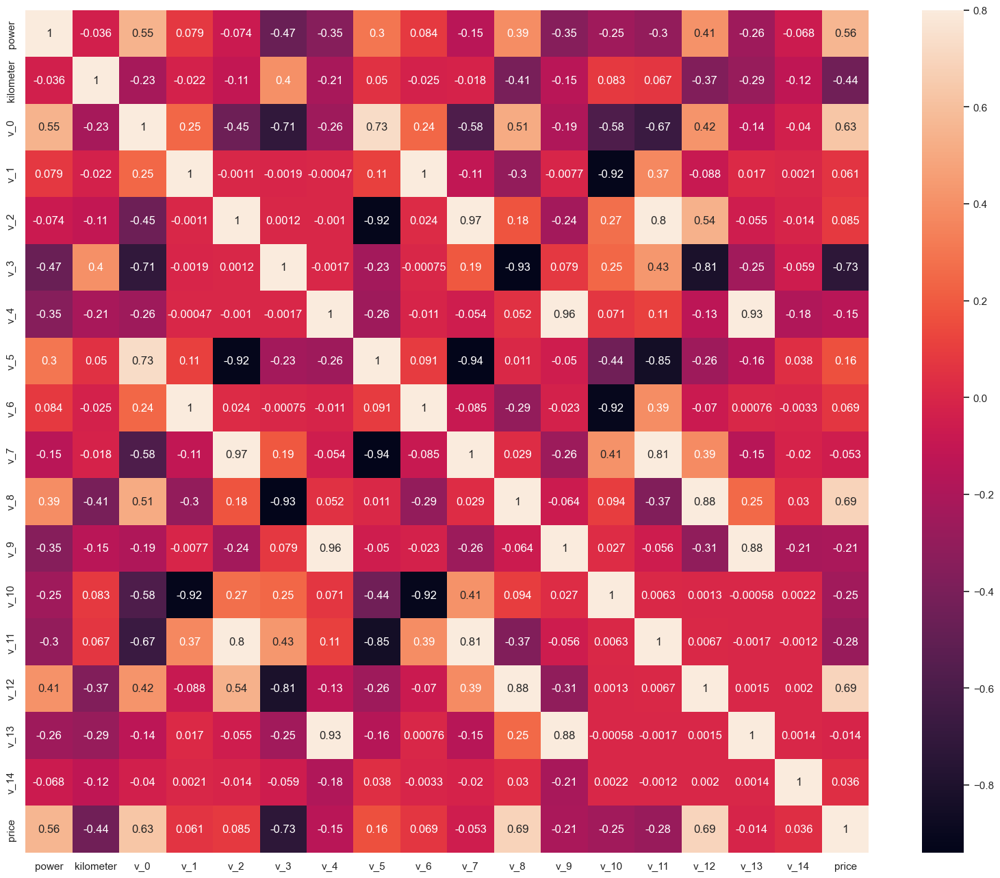

In [37]:
ax = plt.subplots(figsize=(20,16))
sns.heatmap(train_corr, vmax=.8, square=True, annot=True)

In [38]:
from sklearn.decomposition import PCA  # 主成分分析

# 保持95%的信息
pca = PCA(n_components=0.9)
# 去掉target列
new_train_pca_90 = pca.fit_transform(train_data_process.iloc[:,0:-1])
new_test_pca_90 = pca.fit_transform(test_data_process)
new_train_pca_90 = pd.DataFrame(new_train_pca_90)
new_test_pca_90 = pd.DataFrame(new_test_pca_90)
new_train_pca_90['price'] = train_data_process['price']
new_train_pca_90.describe()

,0,1,2,3,price
count,1.500000e+05,1.500000e+05,1.500000e+05,1.500000e+05,150000.000000
mean,-6.915949e-17,2.452438e-16,-2.818486e-18,2.441899e-17,5923.327333
std,4.985988e-01,3.150329e-01,2.887211e-01,2.344199e-01,7501.998477
min,-6.614450e-01,-1.136130e+00,-3.378200e-01,-9.851959e-01,11.000000
25%,-4.230812e-01,-1.590426e-01,-1.447018e-01,-1.724393e-01,1300.000000
50%,-4.085624e-01,6.177308e-02,-7.201815e-02,2.572242e-03,3250.000000
75%,5.489779e-01,2.154900e-01,3.835386e-02,1.679085e-01,7700.000000
max,1.023277e+00,1.159261e+00,1.880388e+00,1.028924e+00,99999.000000


In [39]:
# 保留4列信息
pca = PCA(n_components=4)
# 去掉target列
new_train_pca_4 = pca.fit_transform(train_data_process.iloc[:,0:-1])
new_test_pca_4 = pca.fit_transform(test_data_process)
new_train_pca_4 = pd.DataFrame(new_train_pca_90)
new_test_pca_4 = pd.DataFrame(new_test_pca_90)
new_train_pca_4['price'] = train_data_process['price']
new_train_pca_4.describe()

,0,1,2,3,price
count,1.500000e+05,1.500000e+05,1.500000e+05,1.500000e+05,150000.000000
mean,-6.915949e-17,2.452438e-16,-2.818486e-18,2.441899e-17,5923.327333
std,4.985988e-01,3.150329e-01,2.887211e-01,2.344199e-01,7501.998477
min,-6.614450e-01,-1.136130e+00,-3.378200e-01,-9.851959e-01,11.000000
25%,-4.230812e-01,-1.590426e-01,-1.447018e-01,-1.724393e-01,1300.000000
50%,-4.085624e-01,6.177308e-02,-7.201815e-02,2.572242e-03,3250.000000
75%,5.489779e-01,2.154900e-01,3.835386e-02,1.679085e-01,7700.000000
max,1.023277e+00,1.159261e+00,1.880388e+00,1.028924e+00,99999.000000


In [40]:
new_test_pca_4.describe()

,0,1,2,3
count,5.000000e+04,5.000000e+04,5.000000e+04,5.000000e+04
mean,-2.295053e-17,-6.057377e-17,-7.888801e-17,-4.583001e-18
std,4.990827e-01,3.220145e-01,2.908549e-01,2.558523e-01
min,-6.739532e-01,-1.043630e+00,-3.581137e-01,-1.016363e+00
25%,-4.214763e-01,-2.291887e-01,-1.400025e-01,-1.977541e-01
50%,-4.032672e-01,-6.653193e-02,-6.096617e-02,-1.162114e-02
75%,5.515487e-01,1.622131e-01,4.444676e-02,1.835484e-01
max,1.014497e+00,1.097801e+00,1.833485e+00,1.136739e+00


## 模型训练

In [41]:
#切分数据\
new_train_pca_4 = new_train_pca_4.fillna(0)
train = new_train_pca_4[new_test_pca_4.columns]
price = new_train_pca_4['price']

train_data, test_data, train_price, test_price = train_test_split(
    train, price, test_size=0.2, random_state=0
)

随机森林回归

In [42]:
from sklearn.ensemble import RandomForestRegressor
clf = RandomForestRegressor(n_estimators=500)
clf.fit(train_data, train_price)
score = mean_absolute_error(test_price, clf.predict(test_data))
print('RandomForestRegressor:', score)

RandomForestRegressor(n_estimators=500)

RandomForestRegressor: 963.343059298209


In [43]:
import lightgbm as lgb
clf = lgb.LGBMRegressor(
    learning_rate = 0.01,
    max_depth = -1,
    n_estimators=5000,
    boosting_type='gbdt',
    random_state=2023,
    objective='regression'
)
clf.fit(X=train_data, y=train_price, eval_metric='MAE',verbose=50)

score = mean_absolute_error(test_price, clf.predict(test_data))
print('LGB score:', score)

LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

LGB score: 1013.3072184859717


In [44]:
# train_data2 = pd.read_csv('zhengqi_train.txt','\t')
# test_data2 = pd.read_csv('zhengqi_test.txt','\t')

# train_data2_f = train_data2[test_data2.columns].values
# train_data2_target = train_data2['target'].values

train_value = train.values
price_value = price.values

# LGB模型
from sklearn.model_selection import KFold
import lightgbm as lgb
import numpy as np

# 5折交叉验证
Folds = 5
kf = KFold(n_splits=Folds, shuffle=True, random_state=2023)
# 记录训练和预测MAE
MAE_DICT = {'train_mae':[],'test_mae':[]}

# 线下训练
for i,(train_index, test_index) in enumerate(kf.split(train)):
    # LGB树模型
    lgb_reg = lgb.LGBMRegressor(
        learning_rate=0.01,
        max_depth = -1,
        n_estimators=5000,
        boosting_type='gbdt',
        random_state=2023,
        objective='regression'
    )
    # 切分训练集和测试集
    X_train_KFold, X_test_KFold = train_value[train_index], train_value[test_index]
    y_train_KFold, y_test_KFold = price_value[train_index], price_value[test_index]
    # 训练模型
    lgb_reg.fit(X=X_train_KFold,
               y = y_train_KFold,
               eval_set=[(X_train_KFold, y_train_KFold),
                        (X_test_KFold, y_test_KFold)],
                eval_names = ['Train','Test'],
                early_stopping_rounds=100,
                eval_metric='MAE',
                verbose=50
               )
    y_train_KFold_predict = lgb_reg.predict(
        X_train_KFold, num_iteration=lgb_reg.best_iteration_)
    y_test_KFold_predict = lgb_reg.predict(
        X_test_KFold, num_iteration=lgb_reg.best_iteration_)
    
    print("第{}折， 训练和预测 训练MAE 预测MAE".format(i+1))
    train_mae = mean_absolute_error(y_train_KFold_predict, y_train_KFold)
    print('-----\n','训练MAE\n',train_mae,'\n------')
    test_mae = mean_absolute_error(y_test_KFold_predict, y_test_KFold)
    print('-----\n','训练MAE\n',test_mae,'\n------')
    
    MAE_DICT['train_mae'].append(train_mae)
    MAE_DICT['test_mae'].append(test_mae)
    
print('-------\n','训练MAE\n',MAE_DICT['train_mae'],'\n',np.mean(MAE_DICT['train_mae']),'\n-----')
print('-------\n','测试MAE\n',MAE_DICT['test_mae'],'\n',np.mean(MAE_DICT['test_mae']),'\n-----')

[50]	Train's l1: 3338.61	Train's l2: 2.66309e+07	Test's l1: 3365.55	Test's l2: 2.76734e+07
[100]	Train's l1: 2397.62	Train's l2: 1.48839e+07	Test's l1: 2431.94	Test's l2: 1.57234e+07
[150]	Train's l1: 1870.35	Train's l2: 9.94838e+06	Test's l1: 1910.5	Test's l2: 1.0682e+07
[200]	Train's l1: 1570.16	Train's l2: 7.65155e+06	Test's l1: 1613.9	Test's l2: 8.34819e+06
[250]	Train's l1: 1390.24	Train's l2: 6.41303e+06	Test's l1: 1435.58	Test's l2: 7.0977e+06
[300]	Train's l1: 1275.32	Train's l2: 5.67571e+06	Test's l1: 1320.16	Test's l2: 6.3622e+06
[350]	Train's l1: 1200.89	Train's l2: 5.1935e+06	Test's l1: 1246.35	Test's l2: 5.90838e+06
[400]	Train's l1: 1150.82	Train's l2: 4.87759e+06	Test's l1: 1197.5	Test's l2: 5.62765e+06
[450]	Train's l1: 1117	Train's l2: 4.66539e+06	Test's l1: 1164.8	Test's l2: 5.44508e+06
[500]	Train's l1: 1093.66	Train's l2: 4.50991e+06	Test's l1: 1142.83	Test's l2: 5.32321e+06
[550]	Train's l1: 1076.95	Train's l2: 4.39108e+06	Test's l1: 1127	Test's l2: 5.22522e+06
[60

[4700]	Train's l1: 896.261	Train's l2: 2.80979e+06	Test's l1: 1010.95	Test's l2: 4.56295e+06
[4750]	Train's l1: 895.279	Train's l2: 2.80064e+06	Test's l1: 1010.65	Test's l2: 4.56115e+06
[4800]	Train's l1: 894.347	Train's l2: 2.79075e+06	Test's l1: 1010.38	Test's l2: 4.56027e+06
[4850]	Train's l1: 893.417	Train's l2: 2.78242e+06	Test's l1: 1010.04	Test's l2: 4.55882e+06
[4900]	Train's l1: 892.524	Train's l2: 2.77483e+06	Test's l1: 1009.71	Test's l2: 4.55683e+06
[4950]	Train's l1: 891.62	Train's l2: 2.76642e+06	Test's l1: 1009.49	Test's l2: 4.55513e+06
[5000]	Train's l1: 890.74	Train's l2: 2.75773e+06	Test's l1: 1009.19	Test's l2: 4.55475e+06


LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

第1折， 训练和预测 训练MAE 预测MAE
-----
 训练MAE
 890.7396850817981 
------
-----
 训练MAE
 1009.1940292671082 
------
[50]	Train's l1: 3343.4	Train's l2: 2.65765e+07	Test's l1: 3344.6	Test's l2: 2.76712e+07
[100]	Train's l1: 2399.46	Train's l2: 1.4846e+07	Test's l1: 2403.08	Test's l2: 1.5699e+07
[150]	Train's l1: 1874.05	Train's l2: 9.91426e+06	Test's l1: 1885.86	Test's l2: 1.06852e+07
[200]	Train's l1: 1570.45	Train's l2: 7.60534e+06	Test's l1: 1589.32	Test's l2: 8.34628e+06
[250]	Train's l1: 1389.79	Train's l2: 6.36495e+06	Test's l1: 1412.11	Test's l2: 7.11729e+06
[300]	Train's l1: 1274.67	Train's l2: 5.63816e+06	Test's l1: 1300.52	Test's l2: 6.40422e+06
[350]	Train's l1: 1200.17	Train's l2: 5.1785e+06	Test's l1: 1229.55	Test's l2: 5.9698e+06
[400]	Train's l1: 1149.4	Train's l2: 4.87106e+06	Test's l1: 1181.62	Test's l2: 5.68278e+06
[450]	Train's l1: 1115.71	Train's l2: 4.65884e+06	Test's l1: 1149.93	Test's l2: 5.48585e+06
[500]	Train's l1: 1092.36	Train's l2: 4.50475e+06	Test's l1: 1128.2	Test's l

LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

第2折， 训练和预测 训练MAE 预测MAE
-----
 训练MAE
 945.3699873136568 
------
-----
 训练MAE
 1025.069026675323 
------
[50]	Train's l1: 3332.09	Train's l2: 2.66308e+07	Test's l1: 3378.99	Test's l2: 2.73806e+07
[100]	Train's l1: 2394.51	Train's l2: 1.48821e+07	Test's l1: 2435.99	Test's l2: 1.5482e+07
[150]	Train's l1: 1870.13	Train's l2: 9.95463e+06	Test's l1: 1911.99	Test's l2: 1.05435e+07
[200]	Train's l1: 1569.12	Train's l2: 7.65888e+06	Test's l1: 1610.62	Test's l2: 8.23751e+06
[250]	Train's l1: 1388.53	Train's l2: 6.42973e+06	Test's l1: 1429.22	Test's l2: 7.00305e+06
[300]	Train's l1: 1275.26	Train's l2: 5.69912e+06	Test's l1: 1315.53	Test's l2: 6.27821e+06
[350]	Train's l1: 1200.46	Train's l2: 5.2389e+06	Test's l1: 1240.75	Test's l2: 5.81884e+06
[400]	Train's l1: 1150.18	Train's l2: 4.93414e+06	Test's l1: 1191.13	Test's l2: 5.51771e+06
[450]	Train's l1: 1115.93	Train's l2: 4.73013e+06	Test's l1: 1157.27	Test's l2: 5.32194e+06
[500]	Train's l1: 1093.09	Train's l2: 4.58044e+06	Test's l1: 1135.07	Tes

LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

第3折， 训练和预测 训练MAE 预测MAE
-----
 训练MAE
 904.0344000303229 
------
-----
 训练MAE
 1008.9312849685823 
------
[50]	Train's l1: 3347	Train's l2: 2.68047e+07	Test's l1: 3332.06	Test's l2: 2.69217e+07
[100]	Train's l1: 2404.62	Train's l2: 1.50243e+07	Test's l1: 2392.74	Test's l2: 1.51342e+07
[150]	Train's l1: 1878.18	Train's l2: 1.00759e+07	Test's l1: 1866.76	Test's l2: 1.01652e+07
[200]	Train's l1: 1575.92	Train's l2: 7.75939e+06	Test's l1: 1565.54	Test's l2: 7.82071e+06
[250]	Train's l1: 1394.68	Train's l2: 6.51374e+06	Test's l1: 1386.61	Test's l2: 6.55727e+06
[300]	Train's l1: 1280.69	Train's l2: 5.77504e+06	Test's l1: 1276.58	Test's l2: 5.82501e+06
[350]	Train's l1: 1205.04	Train's l2: 5.30173e+06	Test's l1: 1204.64	Test's l2: 5.36541e+06
[400]	Train's l1: 1154.81	Train's l2: 4.99383e+06	Test's l1: 1157.58	Test's l2: 5.08058e+06
[450]	Train's l1: 1120.75	Train's l2: 4.77982e+06	Test's l1: 1126.3	Test's l2: 4.89023e+06
[500]	Train's l1: 1097.84	Train's l2: 4.62472e+06	Test's l1: 1105.89	Test

[4650]	Train's l1: 900.071	Train's l2: 2.87805e+06	Test's l1: 995.087	Test's l2: 4.19227e+06
[4700]	Train's l1: 899.14	Train's l2: 2.87157e+06	Test's l1: 994.646	Test's l2: 4.19104e+06
[4750]	Train's l1: 898.248	Train's l2: 2.86569e+06	Test's l1: 994.403	Test's l2: 4.1906e+06
[4800]	Train's l1: 897.308	Train's l2: 2.85762e+06	Test's l1: 994.127	Test's l2: 4.18999e+06
[4850]	Train's l1: 896.482	Train's l2: 2.84983e+06	Test's l1: 993.899	Test's l2: 4.18959e+06
[4900]	Train's l1: 895.694	Train's l2: 2.84193e+06	Test's l1: 993.835	Test's l2: 4.19001e+06
[4950]	Train's l1: 894.794	Train's l2: 2.83442e+06	Test's l1: 993.631	Test's l2: 4.18915e+06
[5000]	Train's l1: 893.925	Train's l2: 2.82653e+06	Test's l1: 993.456	Test's l2: 4.1889e+06


LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

第4折， 训练和预测 训练MAE 预测MAE
-----
 训练MAE
 893.9245025236273 
------
-----
 训练MAE
 993.4557618637043 
------
[50]	Train's l1: 3355.31	Train's l2: 2.71734e+07	Test's l1: 3307.6	Test's l2: 2.47981e+07
[100]	Train's l1: 2410.14	Train's l2: 1.52082e+07	Test's l1: 2372.69	Test's l2: 1.381e+07
[150]	Train's l1: 1879.95	Train's l2: 1.01741e+07	Test's l1: 1851.62	Test's l2: 9.26648e+06
[200]	Train's l1: 1577.47	Train's l2: 7.82751e+06	Test's l1: 1559.14	Test's l2: 7.18957e+06
[250]	Train's l1: 1395.59	Train's l2: 6.56507e+06	Test's l1: 1385.14	Test's l2: 6.08608e+06
[300]	Train's l1: 1281.72	Train's l2: 5.82334e+06	Test's l1: 1275.98	Test's l2: 5.44377e+06
[350]	Train's l1: 1206.11	Train's l2: 5.35212e+06	Test's l1: 1204.12	Test's l2: 5.05199e+06
[400]	Train's l1: 1156.66	Train's l2: 5.0386e+06	Test's l1: 1156.83	Test's l2: 4.80153e+06
[450]	Train's l1: 1122.45	Train's l2: 4.82403e+06	Test's l1: 1124.5	Test's l2: 4.63806e+06
[500]	Train's l1: 1099.8	Train's l2: 4.66687e+06	Test's l1: 1103.33	Test's 

LGBMRegressor(learning_rate=0.01, n_estimators=5000, objective='regression',
              random_state=2023)

第5折， 训练和预测 训练MAE 预测MAE
-----
 训练MAE
 941.2922074688743 
------
-----
 训练MAE
 998.987005343093 
------
-------
 训练MAE
 [890.7396850817981, 945.3699873136568, 904.0344000303229, 893.9245025236273, 941.2922074688743] 
 915.0721564836558 
-----
-------
 测试MAE
 [1009.1940292671082, 1025.069026675323, 1008.9312849685823, 993.4557618637043, 998.987005343093] 
 1007.1274216235622 
-----


学习曲线

In [45]:
from sklearn.linear_model import SGDRegressor
from sklearn.model_selection import learning_curve

plt.figure(figsize=(18,10),dpi=150)

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=1, train_sizes=np.linspace(.1,1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel('Training examples')
    plt.ylabel('Score')
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()
    
    plt.fill_between(train_sizes,
                    train_scores_mean - train_scores_std,
                    train_scores_mean + train_scores_std,
                    alpha=0.1,
                    color='r')
    plt.fill_between(train_sizes,
                    test_scores_mean - test_scores_std,
                    test_scores_mean + test_scores_std,
                    alpha=0.1,
                    color='g')
    
    plt.plot(train_sizes,
            train_scores_mean,
            'o-',
            color='r',
            label='Training score')
    plt.plot(train_sizes,
            test_scores_mean,
            'o-',
            color='g',
            label='Cross-validation score')
    plt.legend(loc='best')
    return plt
    

<Figure size 2700x1500 with 0 Axes>

<Figure size 2700x1500 with 0 Axes>

<module 'matplotlib.pyplot' from 'C:\\Users\\user\\.conda\\envs\\mydatamining\\lib\\site-packages\\matplotlib\\pyplot.py'>

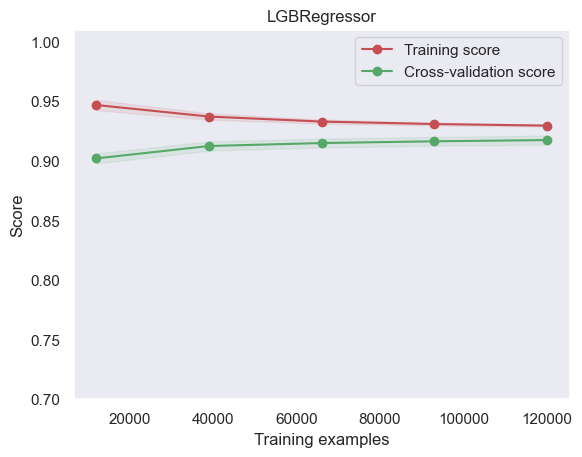

In [46]:
from sklearn.model_selection import ShuffleSplit

X = train.values
y = price.values
title="LGBRegressor"
cv = ShuffleSplit(n_splits=100, test_size=0.2, random_state=0)
estimator = lgb.LGBMRegressor()
plot_learning_curve(estimator, title, X,y, ylim=(0.7,1.01), cv=cv, n_jobs=-1)

使用lgb和xgb融合

In [47]:
from scipy.special import jn
from IPython.display import display, clear_output
import time



## 模型预测的
from sklearn import linear_model
from sklearn import preprocessing
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor

## 数据降维处理的
from sklearn.decomposition import PCA,FastICA,FactorAnalysis,SparsePCA

import lightgbm as lgb
import xgboost as xgb

## 参数搜索和评价的
from sklearn.model_selection import GridSearchCV,cross_val_score,StratifiedKFold,train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [48]:
## 选择特征列


## 提前特征列，标签列构造训练样本和测试样本
X_data = new_train_pca_4[new_test_pca_4.columns]
Y_data = new_train_pca_4['price']

X_test  = new_test_pca_4

print('X train shape:',X_data.shape)
print('X test shape:',X_test.shape)

X train shape: (150000, 4)
X test shape: (50000, 4)


In [49]:
## xgb-Model
xgr = xgb.XGBRegressor(n_estimators=120, learning_rate=0.1, gamma=0, subsample=0.8,\
        colsample_bytree=0.9, max_depth=7) #,objective ='reg:squarederror'

scores_train = []
scores = []

## 5折交叉验证方式
sk=StratifiedKFold(n_splits=5,shuffle=True,random_state=0)
for train_ind,val_ind in sk.split(X_data,Y_data):
    
    train_x=X_data.iloc[train_ind].values
    train_y=Y_data.iloc[train_ind]
    val_x=X_data.iloc[val_ind].values
    val_y=Y_data.iloc[val_ind]
    
    xgr.fit(train_x,train_y)
    pred_train_xgb=xgr.predict(train_x)
    pred_xgb=xgr.predict(val_x)
    
    score_train = mean_absolute_error(train_y,pred_train_xgb)
    scores_train.append(score_train)
    score = mean_absolute_error(val_y,pred_xgb)
    scores.append(score)

print('Train mae:',np.mean(score_train))
print('Val mae',np.mean(scores))

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

Train mae: 933.8919164325073
Val mae 1041.391159252818


### xgb和lgb融合

In [50]:
## 定义了一个统计函数，方便后续信息统计
def Sta_inf(data):
    print('_min',np.min(data))
    print('_max:',np.max(data))
    print('_mean',np.mean(data))
    print('_ptp',np.ptp(data))
    print('_std',np.std(data))
    print('_var',np.var(data))

In [51]:
def build_model_xgb(x_train,y_train):
    model = xgb.XGBRegressor(n_estimators=150, learning_rate=0.1, gamma=0, subsample=0.8,\
        colsample_bytree=0.9, max_depth=7) #, objective ='reg:squarederror'
    model.fit(x_train, y_train)
    return model

def build_model_lgb(x_train,y_train):
    estimator = lgb.LGBMRegressor(num_leaves=127,n_estimators = 150)
    param_grid = {
        'learning_rate': [0.01, 0.05, 0.1, 0.2],
    }
    gbm = GridSearchCV(estimator, param_grid)
    gbm.fit(x_train, y_train)
    return gbm

In [52]:
## Split data with val
x_train,x_val,y_train,y_val = train_test_split(X_data,Y_data,test_size=0.3)

In [53]:
print('Train lgb...')
model_lgb = build_model_lgb(x_train,y_train)
val_lgb = model_lgb.predict(x_val)
MAE_lgb = mean_absolute_error(y_val,val_lgb)
print('MAE of val with lgb:',MAE_lgb)

print('Predict lgb...')
model_lgb_pre = build_model_lgb(X_data,Y_data)
subA_lgb = model_lgb_pre.predict(X_test)
print('Sta of Predict lgb:')
Sta_inf(subA_lgb)

Train lgb...
MAE of val with lgb: 1017.6071012416186
Predict lgb...
Sta of Predict lgb:
_min -2303.9724930518605
_max: 77384.60652287182
_mean 6297.157248669435
_ptp 79688.57901592368
_std 7615.297065359133
_var 57992749.393667415


In [54]:
print('Train xgb...')
model_xgb = build_model_xgb(x_train,y_train)
val_xgb = model_xgb.predict(x_val)
MAE_xgb = mean_absolute_error(y_val,val_xgb)
print('MAE of val with xgb:',MAE_xgb)

print('Predict xgb...')
model_xgb_pre = build_model_xgb(X_data,Y_data)
subA_xgb = model_xgb_pre.predict(X_test)
print('Sta of Predict xgb:')
Sta_inf(subA_xgb)

Train xgb...
MAE of val with xgb: 1030.5007624284215
Predict xgb...
Sta of Predict xgb:
_min -3117.7642
_max: 73633.81
_mean 6833.578
_ptp 76751.58
_std 5813.947
_var 33801976.0


### 进行两模型的结果加权融合

In [55]:
## 这里我们采取了简单的加权融合的方式
val_Weighted = (1-MAE_lgb/(MAE_xgb+MAE_lgb))*val_lgb+(1-MAE_xgb/(MAE_xgb+MAE_lgb))*val_xgb
val_Weighted[val_Weighted<0]=10 # 由于我们发现预测的最小值有负数，而真实情况下，price为负是不存在的，由此我们进行对应的后修正
print('MAE of val with Weighted ensemble:',mean_absolute_error(y_val,val_Weighted))

MAE of val with Weighted ensemble: 1005.2727276494627


(array([1.23906e+05, 1.89270e+04, 4.91800e+03, 1.34000e+03, 4.71000e+02,
        1.88000e+02, 1.24000e+02, 6.00000e+01, 4.80000e+01, 1.80000e+01]),
 array([1.10000e+01, 1.00098e+04, 2.00086e+04, 3.00074e+04, 4.00062e+04,
        5.00050e+04, 6.00038e+04, 7.00026e+04, 8.00014e+04, 9.00002e+04,
        9.99990e+04]),
 <BarContainer object of 10 artists>)

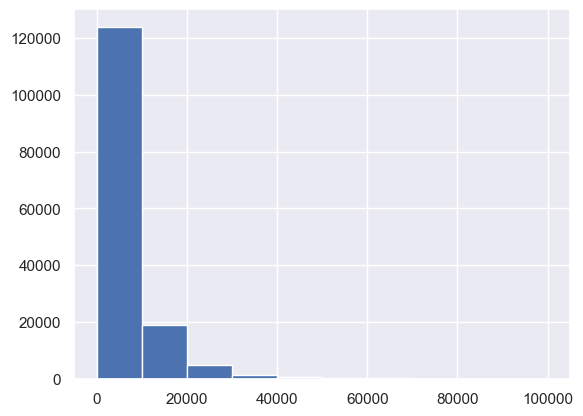

In [56]:
sub_Weighted = (1-MAE_lgb/(MAE_xgb+MAE_lgb))*subA_lgb+(1-MAE_xgb/(MAE_xgb+MAE_lgb))*subA_xgb

## 查看预测值的统计进行
plt.hist(Y_data)
plt.show()
plt.close()

In [58]:
train_data.columns

Index([0, 1, 2, 3], dtype='object')

In [59]:
train_data = pd.read_csv('data/used_car_train_20200313.csv', sep=' ')
test_data = pd.read_csv('data/used_car_testB_20200421.csv', sep=' ')
## 选择特征列
feature_cols = ['power', 'kilometer',  'v_0', 'v_2', 'v_3','v_5', 'v_8','v_11','v_12']

## 提前特征列，标签列构造训练样本和测试样本
X_data = train_data[feature_cols]
Y_data = train_data['price']

X_test  = test_data[feature_cols]

print('X train shape:',X_data.shape)
print('X test shape:',X_test.shape)

X train shape: (150000, 9)
X test shape: (50000, 9)


In [60]:
## xgb-Model
xgr = xgb.XGBRegressor(n_estimators=120, learning_rate=0.1, gamma=0, subsample=0.8,\
        colsample_bytree=0.9, max_depth=7) #,objective ='reg:squarederror'

scores_train = []
scores = []

## 5折交叉验证方式
sk=StratifiedKFold(n_splits=5,shuffle=True,random_state=0)
for train_ind,val_ind in sk.split(X_data,Y_data):
    
    train_x=X_data.iloc[train_ind].values
    train_y=Y_data.iloc[train_ind]
    val_x=X_data.iloc[val_ind].values
    val_y=Y_data.iloc[val_ind]
    
    xgr.fit(train_x,train_y)
    pred_train_xgb=xgr.predict(train_x)
    pred_xgb=xgr.predict(val_x)
    
    score_train = mean_absolute_error(train_y,pred_train_xgb)
    scores_train.append(score_train)
    score = mean_absolute_error(val_y,pred_xgb)
    scores.append(score)

print('Train mae:',np.mean(score_train))
print('Val mae',np.mean(scores))

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=120, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

Train mae: 699.2548607481718
Val mae 787.3011475242663
